## Multi-omic Single-Cell RNA-seq Analysis of an aggressive Sezary Syndrome Patient Sample

As a proof-of-concept I performed multi-omic single-cell sequencing to develop a computational pipeline for the robust identification of tumor cells to support a study incorporating a larger cohort of patients to understand both the molecular and genetic mechanisms of lymphomagenesis, relapse/remission, and resistance to certain therapeutics. Here, I prepared libraries for single-cell gene expression, surface protein expression (antibody labelling/CITE-seq), and T-cell receptor immune repertoire. https://www.10xgenomics.com/products/single-cell-immune-profiling

Small antibody panel designed primarily for identification of T-cells (CD3, CD4, CD8, CD7, CD26)

Below is bash command to process multi-omic single-cell RNA-seq data using cellranger multi.

In [2]:
# cellranger multi --id=CUSSN2 --csv=/home/ubuntu/config.csv

# Load packages

In [3]:
#library(BiocManager)
library(dplyr)
library(shiny) # Trying to load Seurat may give an error that the shiny package is not loaded
library(Seurat)
library(patchwork)
library(tidyverse)
library(data.table)
library(SingleR)
library(celldex)
library(writexl)
library(utils)
library(leiden)
library(ggplot2)
library(RColorBrewer)
library(IRdisplay)

In [9]:
# Load the gene expression (GEX)/antibody-derived tag (ADT) data
CTCL.data <- Read10X("/home/bobby/RStudio/CTCL_ImmuneProfiling/sample_filtered_feature_bc_matrix/")

# Create Seurat Object
CTCL <- CreateSeuratObject(counts = CTCL.data[["Gene Expression"]], min.cells = 0, min.features = 200)
CTCL_CITE <- CreateSeuratObject(counts = CTCL.data[["Antibody Capture"]], min.cells = 0, min.features = 0)
CTCL[["CITE"]] <- CreateAssayObject(CTCL.data[["Antibody Capture"]][,colnames(x = CTCL)])

#For some reason orig.ident is set as SeuratProject
#Replace orig.ident with CTCL
CTCL@meta.data$orig.ident <- "CTCL"

DefaultAssay(CTCL) <- "CITE"
CTCL <- NormalizeData(CTCL, assay = "CITE", normalization.method = "CLR")

# Load in TCR data
tcr <- read.csv("/home/bobby/RStudio/CTCL_ImmuneProfiling/vdj_t/filtered_contig_annotations.csv")
tcr <- tcr[!duplicated(tcr$barcode), ] # Remove duplicates
tcr <- tcr[,c("barcode", "raw_clonotype_id")] # Only keep the barcode and clonotype columns
names(tcr)[names(tcr) == "raw_clonotype_id"] <- "clonotype_id"
tcr <- tcr[tcr$barcode %in% rownames(CTCL@meta.data),] # Remove barcodes not in seurat object
tcr$clonotype_id <- substring(tcr$clonotype_id, 10) # Remove "clonotype" from string
rownames(tcr) <- tcr[,1]
tcr[,1] <- NULL
tcr$clonotype_id <- str_pad(tcr$clonotype_id, 2, pad = "0") # Make all clonal assignments at least 2 characters

# Add TCR clonotype to the Seurat object's metadata.
CTCL@meta.data$tcr <- NULL
CTCL@meta.data$tcr <- "NA"
CTCL@meta.data$tcr[match(rownames(tcr), rownames(CTCL@meta.data))] <- tcr$clonotype_id

# Add in percent.mt metadata
DefaultAssay(CTCL) <- "RNA"
CTCL[["percent.mt"]] <- PercentageFeatureSet(CTCL, pattern = "^MT-")

saveRDS(CTCL, file = "/home/bobby/RStudio/CTCL_ImmuneProfiling/CTCL_ImmuneProfiling.rds")

10X data contains more than one type and is being returned as a list containing matrices of each type.

Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Normalizing across features



# QC and cell filtering

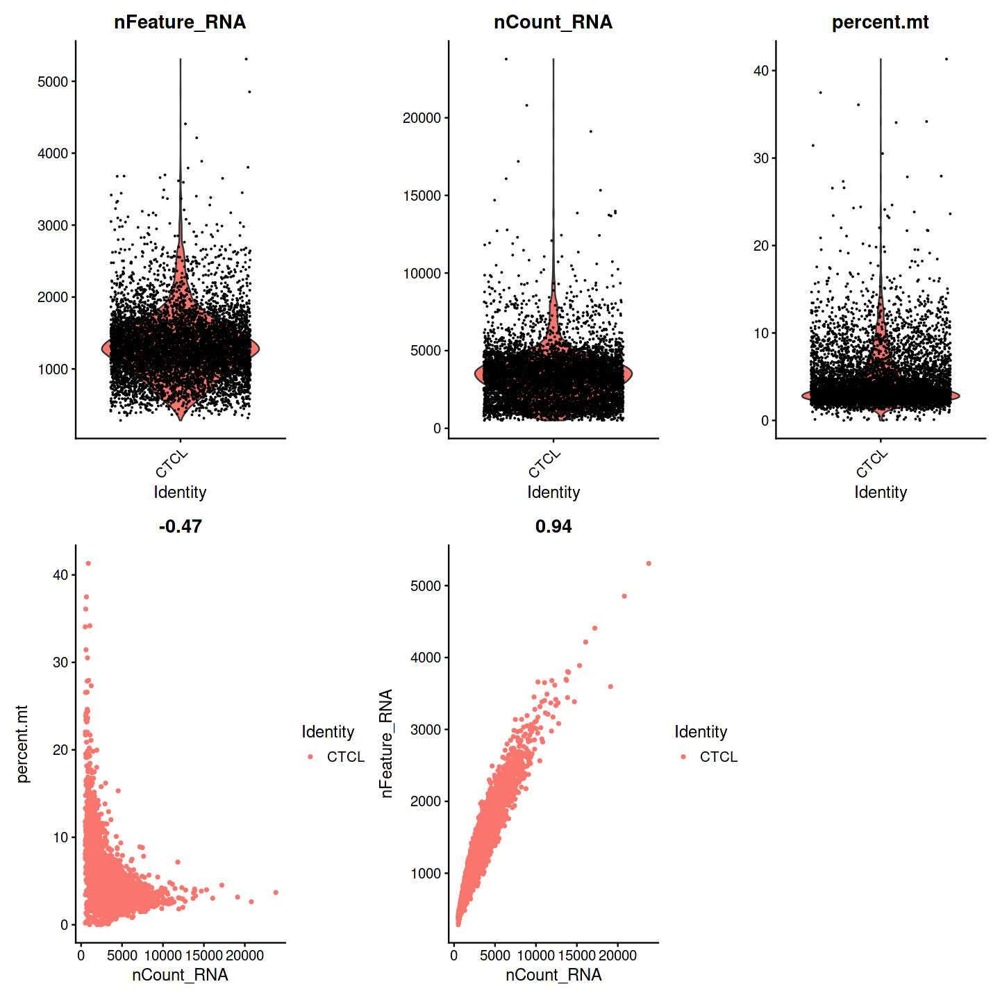

In [10]:
# Violin Plot QC metrics 
VlnPlot <- VlnPlot(CTCL, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), group.by = "orig.ident", ncol = 3)
plot1 <- FeatureScatter(CTCL, feature1 = "nCount_RNA", feature2 = "percent.mt", group.by = "orig.ident")
plot2 <- FeatureScatter(CTCL, feature1 = "nCount_RNA", feature2 = "nFeature_RNA", group.by = "orig.ident")

options(repr.plot.width=12, repr.plot.height=12)
VlnPlot + plot1 + plot2

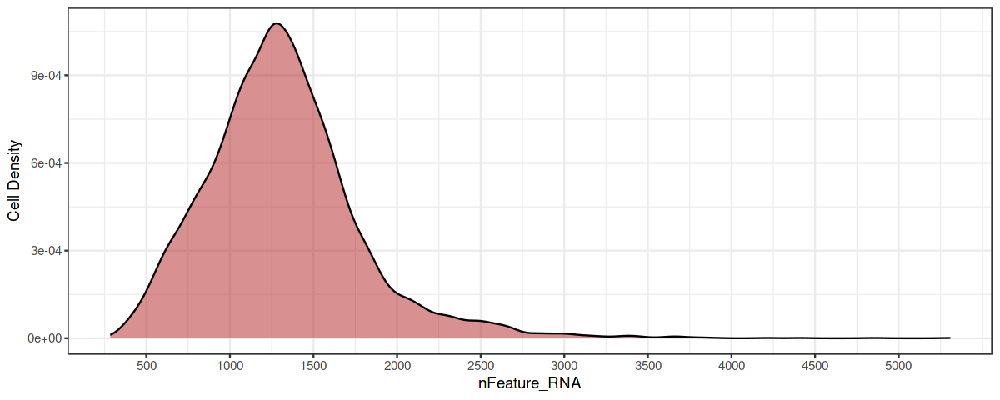

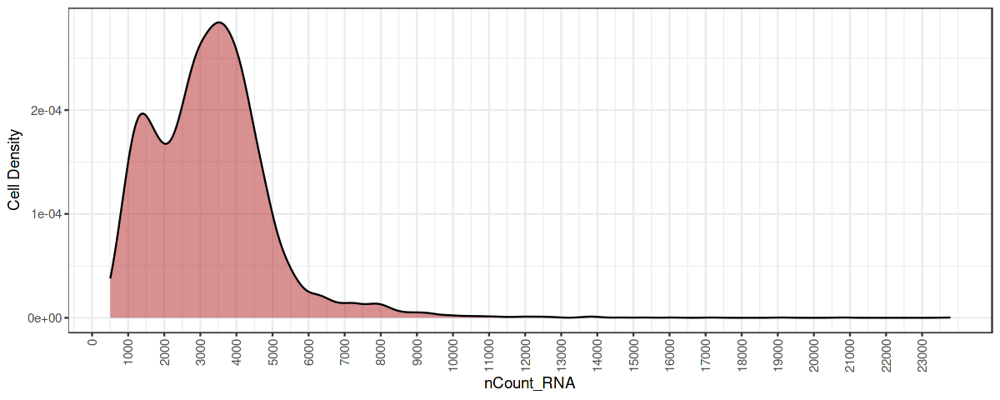

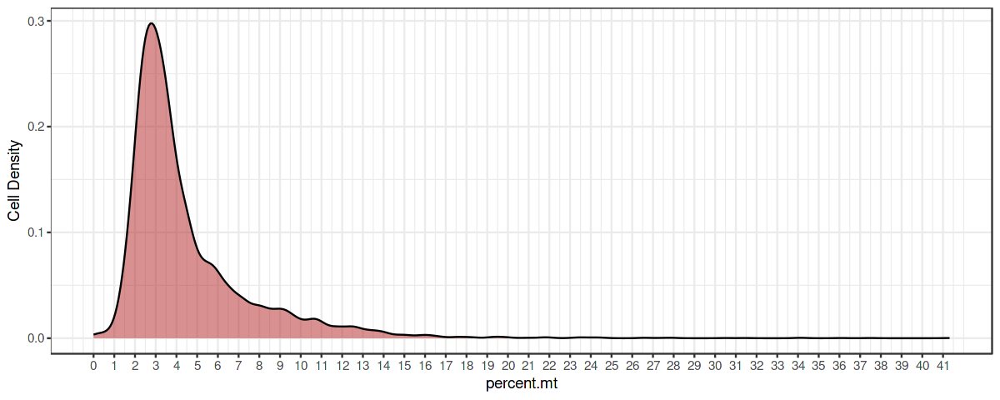

In [14]:
# Generate density plots for each QC metric
options(repr.plot.width=10, repr.plot.height=4)
ggplot(CTCL@meta.data, aes(x = nFeature_RNA, fill = "gray")) +
  geom_density(alpha = 0.5) +
  scale_x_continuous(breaks = round(seq(0, max(CTCL@meta.data$nFeature_RNA), by = 500), 0)) +
  theme_bw() +
  theme(legend.position = "none") +
  ylab("Cell Density") +
  scale_fill_manual(values = "firebrick")

ggplot(CTCL@meta.data, aes(x = nCount_RNA, fill = "gray")) +
  scale_x_continuous(breaks = round(seq(0, max(CTCL@meta.data$nCount_RNA), by = 1000), 0)) +
  geom_density(alpha = 0.5) +
  theme_bw() +
  theme(legend.position = "none",
        axis.text.x = element_text(angle = 90, vjust = 0.5, hjust=1)) +
  ylab("Cell Density") +
  scale_fill_manual(values = "firebrick")

ggplot(CTCL@meta.data, aes(x = percent.mt, fill = "gray")) +
  geom_density(alpha = 0.5) +
  theme_bw() +
  theme(legend.position = "none") +
  scale_x_continuous(breaks = round(seq(0, max(CTCL@meta.data$percent.mt), by = 1), 0)) +
  ylab("Cell Density") +
  scale_fill_manual(values = "firebrick")

Based on plots, filter out cells with <200 nFeature_RNA or >3000 nFeature_RNA or percent.mt > 8

In [15]:
# Filter out cells with fewer than 200 or greater than 2500 genes or percent mito greater than 8
ncol(CTCL) - ncol(subset(CTCL, subset = nFeature_RNA > 200 & nFeature_RNA < 2500 & percent.mt < 8)) # Num cells filtered out

# 929 cells removed from 6705 cells
CTCL <- subset(CTCL, subset = nFeature_RNA > 200 & nFeature_RNA < 2500 & percent.mt < 8)

saveRDS(CTCL, file = "/home/bobby/RStudio/CTCL_ImmuneProfiling/CTCL_ImmuneProfiling.rds")

[1] 929

Normalize data

In [16]:
DefaultAssay(CTCL) <- "CITE"
CTCL <- NormalizeData(CTCL, assay = "CITE", normalization.method = "CLR")

DefaultAssay(CTCL) <- "RNA"
CTCL <- SCTransform(CTCL, vars.to.regress = "percent.mt")

# Save a copy for the snakemake pipeline
saveRDS(CTCL, file = "/home/bobby/RStudio/CTCL_ImmuneProfiling/CTCL_ImmuneProfiling_Snakemake.rds")

CTCL <- RunPCA(CTCL, verbose = FALSE)

saveRDS(CTCL, file = "/home/bobby/RStudio/CTCL_ImmuneProfiling/CTCL_ImmuneProfiling.rds")

Normalizing across features

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 16667 by 5776

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 2000 genes, 5000 cells



  |======================================================================| 100%


Found 103 outliers - those will be ignored in fitting/regularization step


Second step: Get residuals using fitted parameters for 16667 genes



  |======================================================================| 100%


Computing corrected count matrix for 16667 genes



  |======================================================================| 100%


Calculating gene attributes

Wall clock passed: Time difference of 41.01814 secs

Determine variable features

Place corrected count matrix in counts slot

Regressing out percent.mt

Centering data matrix

Set default assay to SCT



Use elbow plot to determine optimal number of PCs

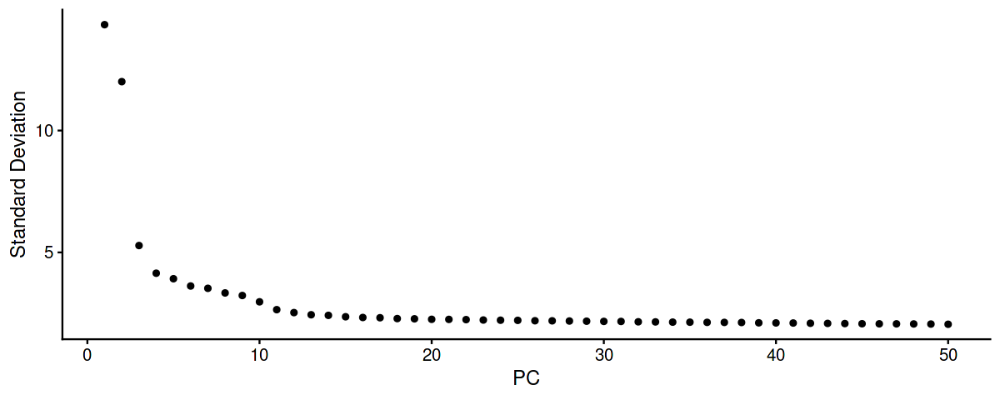

In [17]:
ElbowPlot(CTCL, ndims = 50) # Based on elbowplot, will carry forward 20 PCs. scTransform transformed data benefits from pushing the PC counts bc it is better at capturing true biological variability

Perform UMAP and TSNE dimensionality reduction

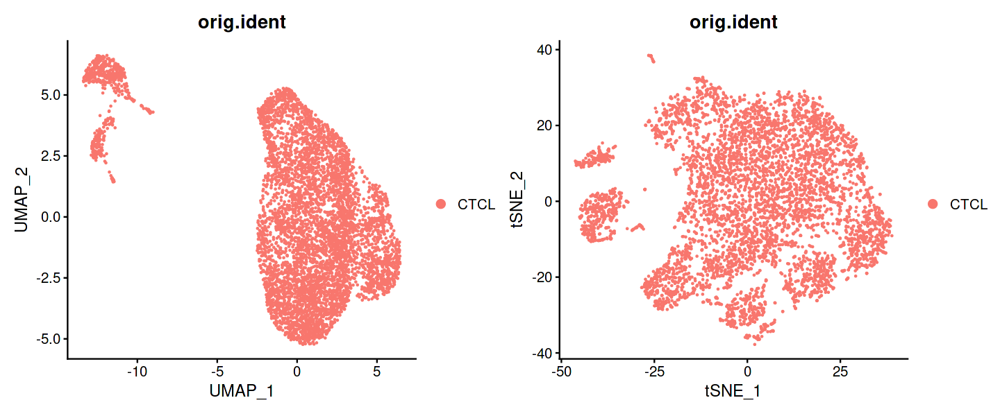

In [27]:
options(repr.plot.width=12, repr.plot.height=5)

CTCL <- RunUMAP(CTCL, dims = 1:20)
CTCL <- FindNeighbors(CTCL, dims = 1:20)
UMAP <- DimPlot(CTCL, label = FALSE, reduction = "umap", group.by = "orig.ident", pt.size = 0.25)
CTCL <- RunTSNE(CTCL, dims = 1:20)
tSNE <- DimPlot(object = CTCL, label = FALSE, reduction = "tsne", group.by = "orig.ident", pt.size = 0.25)

UMAP + tSNE

Perform Clustering, save clustering dimplots, generate heatmaps of top marker genes for each cluster across various resolutions

In [ ]:
for (i in seq(from = 0.05, to = 0.5, by = 0.05)){
  setwd("/home/bobby/RStudio/CTCL_ImmuneProfiling/LeidenUMAP")
  CTCL <- FindClusters(CTCL, resolution = i, algorithm = 4)
  png(filename = paste("Leiden", i, ".png", sep=""), width = 1000, height = 900)
  LeidenPlot <- DimPlot(CTCL, label = TRUE, label.size = 8, reduction = "umap", group.by = paste("SCT_snn_res.", i, sep = ""), pt.size = 1.25)
  print(LeidenPlot)
  dev.off()
  setwd("/home/bobby/RStudio/CTCL_ImmuneProfiling/LeidenTSNE")
  png(filename = paste("Leiden", i, ".png", sep=""), width = 1000, height = 900)
  LeidenPlot <- DimPlot(CTCL, label = TRUE, label.size = 8, reduction = "tsne", group.by = paste("SCT_snn_res.", i, sep = ""), pt.size = 1.25)
  print(LeidenPlot)
  dev.off()
  CTCL.markers <- FindAllMarkers(CTCL, min.pct = 0.25, logfc.threshold = 0.25)
  top10 <- CTCL.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC)
  top20 <- CTCL.markers %>% group_by(cluster) %>% top_n(n = 20, wt = avg_log2FC)
  write.csv(top20, paste("/home/bobby/RStudio/CTCL_ImmuneProfiling/LeidenBiomarkers/LeidenRes", i, ".Top20Genes.csv", sep = ""), row.names = FALSE)
  setwd("/home/bobby/RStudio/CTCL_ImmuneProfiling/LeidenHeatmap")
  png(filename = paste("LeidenRes", i, ".png", sep=""), width = 1200, height = 1200)
  LeidenHeatmap <- DoHeatmap(CTCL, features = top10$gene, size = 8) + NoLegend()
  print(LeidenHeatmap)
  dev.off()
}

saveRDS(CTCL, file = "/home/bobby/RStudio/CTCL_ImmuneProfiling/CTCL_ImmuneProfiling.rds")

Silhouette analysis to determine optimal clustering resolution

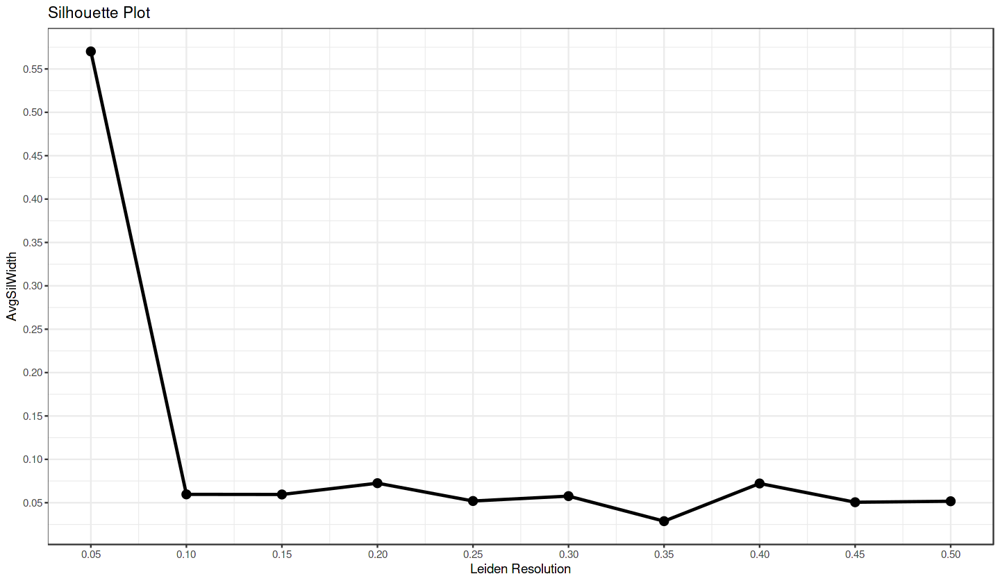

In [31]:
options(repr.plot.width=12, repr.plot.height=7)

library(cluster)
SilScores <- data.frame(Res = character(10), AvgSilWidth = character(10))
dist.matrix <- dist(x = Embeddings(object = CTCL[["pca"]])[, 1:50])

for (i in 1:10){
  CTCL <- SetIdent(CTCL, value = paste("SCT_snn_res.",i*0.05, sep = ""))
  Clusters = Idents(CTCL)
  sil <- silhouette(x = as.numeric(x = as.factor(x = Clusters)), dist = dist.matrix)
  SilScores[i, 1] <- i*0.05
  SilScores[i, 2] <- mean(sil[,3])
}

# Plot Silhouette scores as a function of leiden resolution
SilScores$Res <- as.numeric(SilScores$Res)
SilScores$AvgSilWidth <- as.numeric(SilScores$AvgSilWidth)
SilPlot <- ggplot(SilScores, aes(x = Res, y = AvgSilWidth)) + 
  geom_line(size = 1) +
  geom_point(size = 3) +
  scale_y_continuous(name = "AvgSilWidth", breaks = seq(0, max(SilScores$AvgSilWidth), by = 0.05)) +
  scale_x_continuous(name = "Leiden Resolution", breaks = seq(0, 0.5, by = 0.05)) +
  ggtitle("Silhouette Plot") +
  theme_bw()
SilPlot

Based on silhouette scoring, a resolution of 0.05 is most optimal. We can also evaluate this based on the heatmap, looking at which resolution produces the highest number of transcriptionally distinct clusters, however I find that using a statistical approach is best.

Note that the above analysis can also be performed across varying PCs (runUMAP, FindNeighbors) and k.param (FindNeighbors) in addition to resolution (FindClusters). So for instance, if I evaluated clustering across 3 PCs, 3 k.param, and 10 resolutions I would generate and evaluate 90 clustering iterations. In my experience I find that PCs and k.param do not have a big impact on the final dataset, but tuning these or other parameters should be considered depending on the dataset and the needs of the project. To do this we can use the SnakeMake pipeline.

Other alternative ways of evaluating optimal resolution is to calculate a jaccard index using the scclusteval package, which is not demonstrated here. 


# Cell cycle scoring

There does not appear to be any particular cluster defined by proliferating cells.

Warning message:
“The following features are not present in the object: MLF1IP, RAD51, CDC45, EXO1, DSCC1, E2F8, not searching for symbol synonyms”
Warning message:
“The following features are not present in the object: UBE2C, BIRC5, FAM64A, CKAP2L, AURKB, GTSE1, HJURP, HN1, TTK, CDC25C, KIF2C, DLGAP5, KIF23, ANLN, NEK2, GAS2L3, not searching for symbol synonyms”


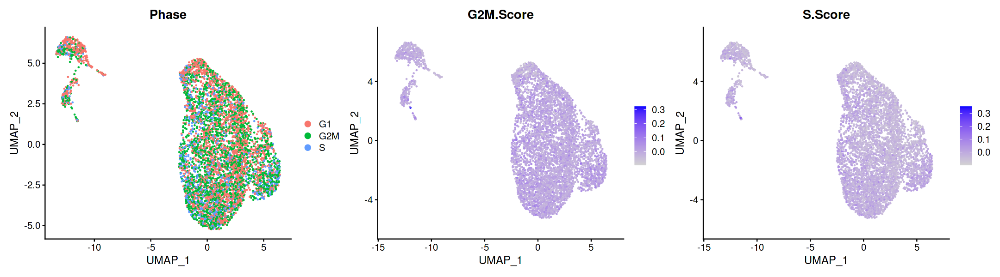

In [34]:
options(repr.plot.width=18, repr.plot.height=5)

# A list of cell cycle markers, from Tirosh et al, 2015, is loaded with Seurat.  We can
# segregate this list into markers of G2/M phase and markers of S phase
s.genes <- cc.genes$s.genes
g2m.genes <- cc.genes$g2m.gene
CTCL <- CellCycleScoring(CTCL, s.features = s.genes, g2m.features = g2m.genes, set.ident = TRUE)
phase <- DimPlot(CTCL, reduction = "umap", group.by = "Phase", pt.size = 0.25)
G2M <- FeaturePlot(CTCL, reduction = "umap", feature = "G2M.Score", pt.size = 0.25)
S <- FeaturePlot(CTCL, reduction = "umap", feature = "S.Score", pt.size = 0.25)

phase + G2M + S

# SingleR identification of cell types

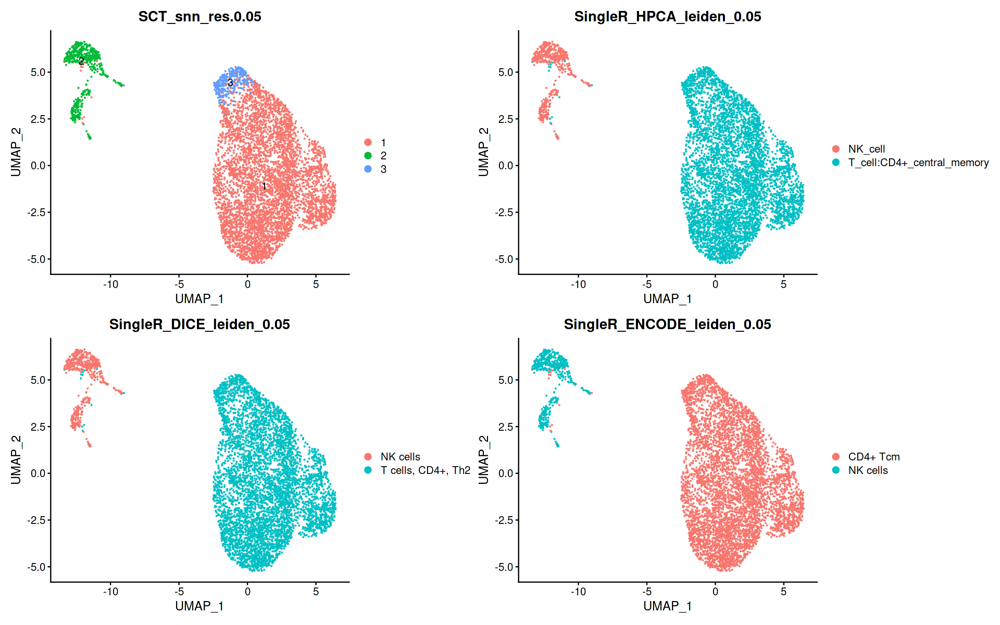

In [38]:
options(repr.plot.width=16, repr.plot.height=10)

SingleR_Ref <- list()
CTCL.Predict <- list()
SingleR_Ref[["HPCA_Ref"]] <- HumanPrimaryCellAtlasData()
SingleR_Ref[["DICE_Ref"]] <- DatabaseImmuneCellExpressionData()
SingleR_Ref[["ENCODE_Ref"]] <- BlueprintEncodeData()
ref <- c("HPCA_Ref", "DICE_Ref", "ENCODE_Ref")

CTCL <- SetIdent(CTCL, value = "SCT_snn_res.0.05")

for (i in 1:length(ref)) {
  CTCL.Predict[[ref[i]]] <- SingleR(test = CTCL[["SCT"]]@data, 
                             ref = SingleR_Ref[[ref[i]]],
                             clusters = CTCL[[]]$SCT_snn_res.0.05,
                             labels = SingleR_Ref[[ref[i]]]$label.fine,
                             assay.type.ref = "logcounts")
  
  # The below uses the grid and gridExtra packages to add a title to each heatmap in order to distinguish them. 
  # The title is not ideally positioned but does the job, so is kept this way.
  my_title <- textGrob(ref[i], gp = gpar(fontsize = 12, fontface = "bold"))
  plot <- plotScoreHeatmap(CTCL.Predict[[ref[i]]], order.by = "clusters", clusters = rownames(CTCL.Predict[[ref[i]]]), cluster_cols = FALSE, silent = TRUE)
  grid.arrange(grobs = list(my_title, plot[[4]]), heights = c(0.1, 1))
  
  # Export scores in .csv format
  write.csv(CTCL.Predict[[ref[i]]], paste("/home/bobby/RStudio/CTCL_ImmuneProfiling/SingleR/", ref[i], "_score.csv", sep = ""))
}

# Add in labels to seurat object
CTCL@meta.data$SingleR_HPCA_leiden_0.05 <-  CTCL.Predict[["HPCA_Ref"]]$labels[match(CTCL[[]]$SCT_snn_res.0.05,
                                                                      rownames(CTCL.Predict[["HPCA_Ref"]]))]
CTCL@meta.data$SingleR_DICE_leiden_0.05 <-  CTCL.Predict[["DICE_Ref"]]$labels[match(CTCL[[]]$SCT_snn_res.0.05,
                                                                      rownames(CTCL.Predict[["DICE_Ref"]]))]
CTCL@meta.data$SingleR_ENCODE_leiden_0.05 <-  CTCL.Predict[["ENCODE_Ref"]]$labels[match(CTCL[[]]$SCT_snn_res.0.05,
                                                                        rownames(CTCL.Predict[["ENCODE_Ref"]]))]

saveRDS(CTCL, file = "/home/bobby/RStudio/CTCL_ImmuneProfiling/CTCL_ImmuneProfiling.rds")

DimPlot_leiden0.05 <- DimPlot(CTCL, 
                             reduction = "umap", 
                             group.by = "SCT_snn_res.0.05", 
                             label = TRUE, 
                             pt.size = 0.1)

DimPlot_HPCA <- DimPlot(CTCL, 
                        reduction = "umap", 
                        group.by = "SingleR_HPCA_leiden_0.05", 
                        label = FALSE, 
                        pt.size = 0.1)
DimPlot_DICE <- DimPlot(CTCL, 
                        reduction = "umap", 
                        group.by = "SingleR_DICE_leiden_0.05", 
                        label = FALSE, 
                        pt.size = 0.1)
DimPlot_ENCODE <- DimPlot(CTCL, 
                          reduction = "umap", 
                          group.by = "SingleR_ENCODE_leiden_0.05", 
                          label = FALSE, 
                          pt.size = 0.1)

DimPlot_leiden0.05 + DimPlot_HPCA + DimPlot_DICE + DimPlot_ENCODE

# Evaluate TCR clonality

.
  01   02   03   04   05   06   07   08   09   10   11   12   13   14   16   17 
3724   29    8    8    4    4    4    4    2    3    3    2    2    2    1    1 
  18   19   20   21   22   23   24   25   26   27   28   29   33   34   36   37 
   1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1 
  39   41   42   43   44   46   48   49   50   51   52   53   54   55   57   58 
   1    1    1    1    1    1    1    1    1    1    1    1    1    1    1    1 
  59   60   61   62   63   64   65   66   67   NA 
   1    1    1    1    1    1    1    1    1 1934 

`summarise()` has grouped output by 'SCT_snn_res.0.05'. You can override using
the `.groups` argument.


SCT_snn_res.0.05,tcr,n,freq
<fct>,<chr>,<int>,<dbl>
1,01,3647,0.7444376403
1,17,1,0.0002041233
1,18,1,0.0002041233
1,21,1,0.0002041233
1,25,1,0.0002041233
1,27,1,0.0002041233


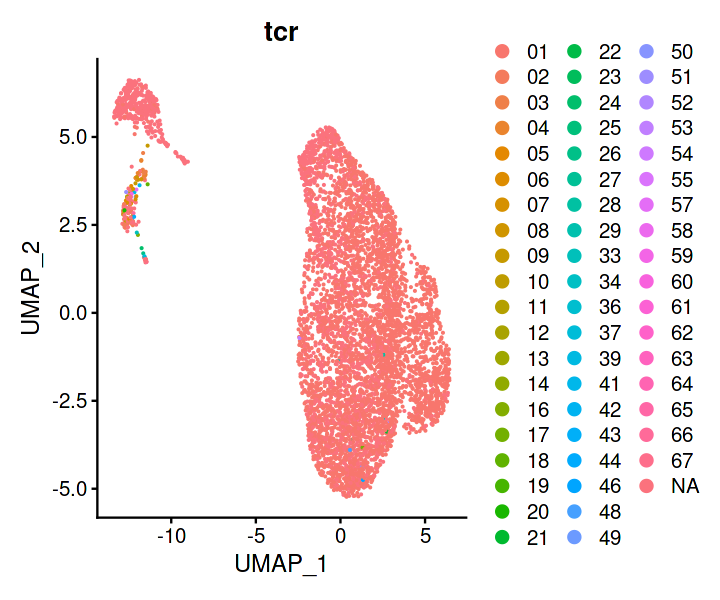

In [41]:
options(repr.plot.width=6, repr.plot.height=5)

DimPlot(CTCL, reduction = "umap", group.by = "tcr", label = FALSE,pt.size = 0.1)

CTCL@meta.data$tcr %>% table() # Display total number of each TCR clonotype

# Display frequency of tcr clones relative to cluster ID
CTCL@meta.data[,c("SCT_snn_res.0.05", "tcr")] %>% group_by(SCT_snn_res.0.05, tcr) %>% summarise(n = n()) %>%
  mutate(freq = n / sum(n)) %>% head()

Just visually based on the UMAP we can see that the most dominant clone # 1 is mostly present in cluster 1. This is also backed up in the relative frequency table, in which 74.4% (3647) of cluster 1 cells are identified as TCR Clone 1. In cluster 2, the most frequent clone identified is also clone 1 at 7.3% (4). For cluster 3, the most frequent clone identified is also clone 1 at 11.2% (37).

In addition, SingleR analysis identifies clusters 1 and 3 as T-cells consistently. Using HPCA and ENCODE references, these cells are identified as TCM cells, the known cell-of-origin for CTCL. Based on this result, cluster 1 is most likely malignant cells based on cell type classification and TCR analysis. While cluster 3 may also be malignant as well, the TCR data does not necessarily support this.

For the purposes of this analysis, cluster 1 will be considered the dominant tumor clone. While this does omit some clone 1 cells identified in cluster 2 and 3, these will be considered artifacts as the number of these cells is small. 

To add an additional layer of validation for tumor cell identity, we can perform copy number alteration (CNA) analysis using inferCNV or numbat. Both of these methods require a reference within the dataset. For this dataset, only cluster 3 contains T-cells that are candidates for normal. However, as they cluster so closely to the malignant cluster 1, there are some reasonable concerns about whether they are malignant or not. While it is entirely possible for malignant cells to closely mimic the gene expression profile of normal counterparts, in this case we know that Sezary cells are highly atypical. In this context, I would normally suggest integrating normal cells from another scRNA-seq dataset. For simplicity sake, this is not done here and a numbat analysis using cluster 1 as query cells and using cluster 3 as reference is demonstrated below. 


# Numbat Integration

Pre-process SNP data

https://kharchenkolab.github.io/numbat/articles/numbat.html#preparing-data

Preparing data does not use much memory. It is best to run this in a compute intensive instance (C5a, for instance).

In [ ]:
# Below are bash commands

Rscript /home/bobby/numbat/inst/bin/pileup_and_phase.R \
    --label CTCL \
    --samples CTCL \
    --bams /home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/preprocessing/sample_alignments.bam \
    --barcodes /home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/preprocessing/barcodes.tsv \
    --outdir /home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/preprocessing/ \
    --gmap /home/bobby/Eagle_v2.4.1/tables/genetic_map_hg38_withX.txt.gz \
    --snpvcf /home/bobby/numbat_data/genome1K.phase3.SNP_AF5e2.chr1toX.hg38.vcf \
    --paneldir /home/bobby/numbat_data/1000G_hg38 \
    --ncores 8

gzip -dk /home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/preprocessing/CTCL_allele_counts.tsv.gz


PREPARE EXPRESSION DATA

Numbat takes a gene by cell integer UMI count matrix as input. You can directly use results from upstream transcriptome quantification pipelines such as 10x CellRanger.

In [ ]:
library(numbat)
library(readr)

CTCL <- SetIdent(CTCL, value = "SCT_snn_res.0.05")

# Create seurat object for cells of interest
CTCL_numbat <- subset(CTCL, ident = 1)

# Create seurat object for reference cells
CTCL_numbat_ref <- subset(CTCL, ident = 3)

# Export count matrix for cells of interest
count_mat <- CTCL_numbat[["RNA"]]@counts

# Prepare reference count data. If using custom reference will need to use aggregate_count()
# cell_annot is a dataframe with columns "cell" and "group"
count_mat_ref <- CTCL_numbat_ref[["RNA"]]@counts
cell_annot <- data.frame(matrix(nrow = ncol(CTCL_numbat_ref), ncol = 0))
cell_annot$cell <- CTCL_numbat_ref %>% colnames()
cell_annot$group <- CTCL_numbat_ref@meta.data$orig.ident
ref_internal <- aggregate_counts(count_mat_ref, cell_annot)
rm(cell_annot)

saveRDS(count_mat, file = "/home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/count_mat.rds")
saveRDS(count_mat_ref, file = "/home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/count_mat_ref.rds")
saveRDS(ref_internal, file = "/home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/ref_internal.rds")

# RUN NUMBAT

In [ ]:
library(numbat)
library(readr)

count_mat <- readRDS(file = "/home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/count_mat.rds")
ref_internal <- readRDS(file = "/home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/ref_internal.rds")
df_allele <- read_tsv(file = "/home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/preprocessing/CTCL_allele_counts.tsv")

# run
out <- run_numbat(
    count_mat, # gene x cell integer UMI count matrix 
    ref_internal, # reference expression profile, a gene x cell type normalized expression level matrix
    df_allele, # allele dataframe generated by pileup_and_phase script
    genome = "hg38",
    t = 1e-5,
    ncores = 8,
    plot = TRUE,
    max_entropy = 0.5,
    out_dir = '/home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/out/'
)

print(out)

Final results and clonal assignments is visualized below. Note that clone 1 is defined as normal. Reference cells are not visualized.

Warning message in gzfile(file, "rb"):
“cannot open compressed file '/home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/out/treeML_2.rds', probable reason 'No such file or directory'”
Could not read the input file /home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/out/treeML_2.rds with readRDS(). Please check that the file is valid.



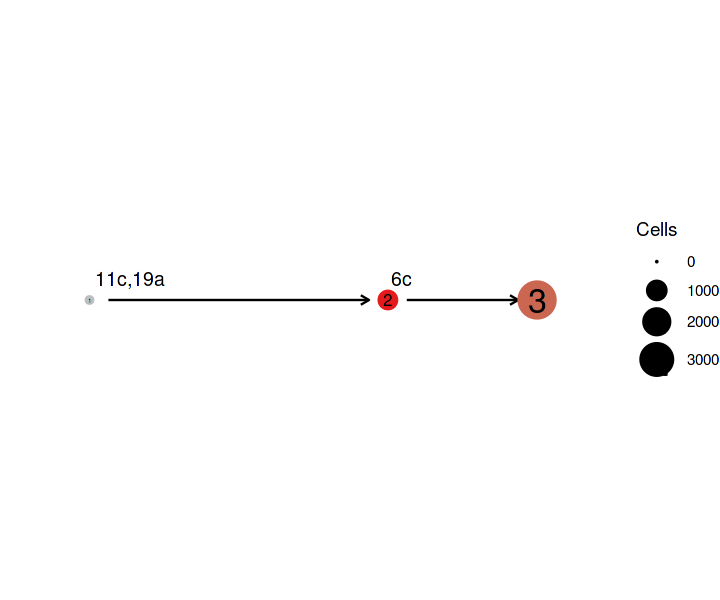

In [44]:
# Visualize mutational history
nb <- Numbat$new(out_dir = '/home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/out')
plot <- nb$plot_mut_history()
print(plot)

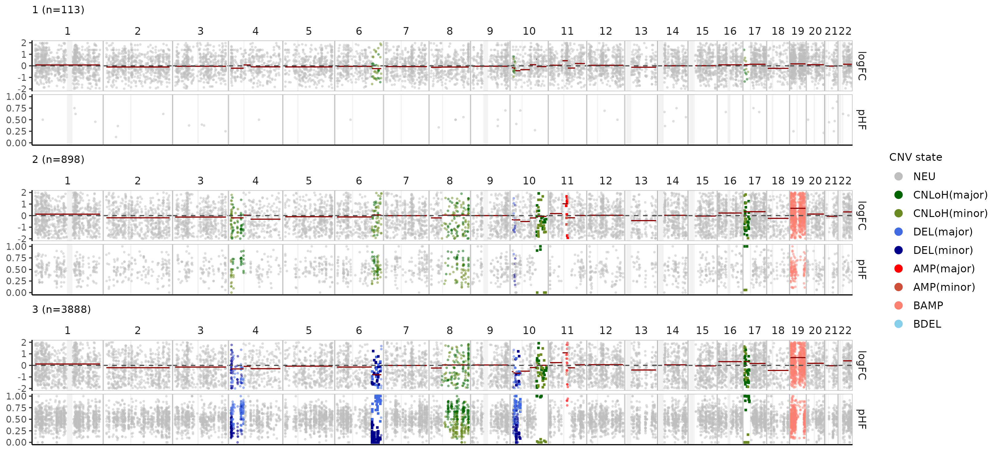

In [47]:
display_png(file="/home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/out/bulk_clones_final.png")  

Numbat is identifying deletions in chr 4, 6, 10 and amp in chr 11 and 19. Deletions in chr 10q are recurrent in CTCL (https://www.ncbi.nlm.nih.gov/pmc/articles/PMC4552614/), providing additional evidence that cluster 1 represents malignant cells. Numbat clone 2 is identified as a pre-cursor cell population to clone 3. Interestingly, most of the copy number events identified in this clone are transcriptionally neutral, implying that these cells are phenotypically "normal". More investigation would need to be done to confirm whether these are truly malignant precursors. The presence of ~113 "normal" cells may represent normal cells that closely resemble the malignant cells, and may even be considered the cell of origin for the tumor (although more evidence is needed to support this). 


IMPORT NUMBAT RESULTS TO SEURAT OBJECT

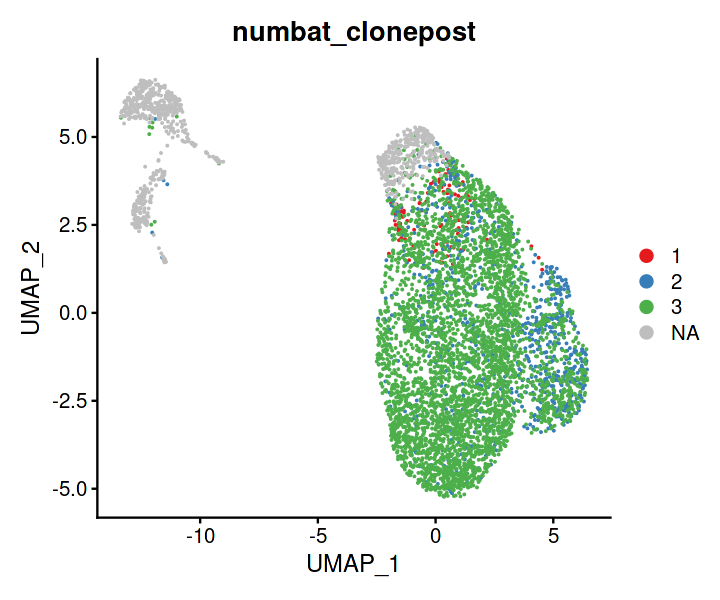

In [48]:
nb_clonepost <- nb$clone_post

numbat_meta <- data.frame(matrix(ncol = 2, nrow = CTCL %>% ncol()))
colnames(numbat_meta) <- c("cell", "clone_opt")
numbat_meta$cell <- CTCL %>% colnames()
numbat_meta$clone_opt <- "NA" # All cells not contained within the seurat object will be labelled "NA" here
numbat_meta$clone_opt[match(nb_clonepost$cell, numbat_meta$cell)] <- nb_clonepost$clone_opt # Add in numbat clone label
row.names(numbat_meta) <- numbat_meta$cell
numbat_meta$cell <- NULL

CTCL@meta.data$numbat_clonepost <- numbat_meta$clone_opt

DimPlot(CTCL, 
        reduction = "umap", 
        group.by = "numbat_clonepost", 
        cols = c("#E41A1C","#377EB8","#4DAF4A", "gray"), 
        order = c("NA", "3", "2", "1"), 
        pt.size = 0.05, 
        raster = FALSE)

IMPORT SINGLE CELL CNV POSTERIORS TO SEURAT OBJECT

CNV posterior does not represent a "degree" of CNV but rather the probability of that event occurring in a single cell. Here, we import these CNV posteriors to the seurat object to visualize this using standard seurat tools (FeaturePlot, DotPlot, VlnPlot, etc).

Warning message:
“Scaling data with a low number of groups may produce misleading results”


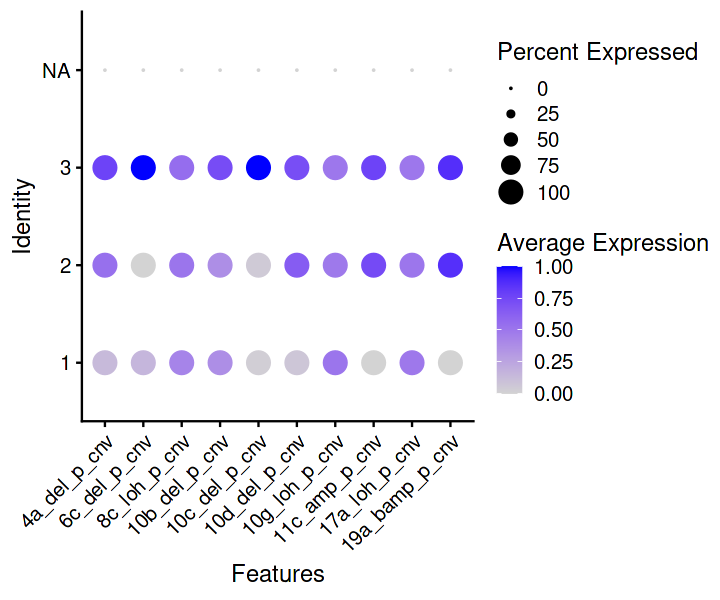

In [56]:
nb_joint_post <- nb$joint_post

muts  <-  nb$joint_post %>% distinct(seg)
muts <- muts$seg
cnv_type <-  nb$joint_post %>% distinct(seg, cnv_state) %>% {setNames(.$cnv_state, .$seg)}

cnv_post_meta <- data.frame(matrix(0, ncol = length(muts), nrow = CTCL %>% ncol()))
rownames(cnv_post_meta) <- CTCL %>% colnames()
cnv_name <- paste(muts, cnv_type, "p", "cnv", sep = "_")
colnames(cnv_post_meta) <- cnv_name

for (i in 1:length(muts)) {
  nb_joint_post_temp <- subset(nb_joint_post, seg == muts[i] & cnv_state == cnv_type[i])
  cnv_post_meta[match(nb_joint_post_temp$cell, rownames(cnv_post_meta)),i] <- nb_joint_post_temp$p_cnv
  rm(nb_joint_post_temp)
}

CTCL@meta.data <- cbind(CTCL@meta.data, cnv_post_meta) # Add into Seurat meta data

rm(cnv_post_meta)
rm(nb_joint_post)

# Visualize posteriors using VlnPlot and save plots
for (i in 1:length(muts)) {
  setwd("/home/bobby/RStudio/CTCL_ImmuneProfiling/numbat/seurat/VlnPlot")
  png(filename = paste(cnv_name[i], ".png", sep = ""), width = 900, height = 500)
  plot <- VlnPlot(CTCL, features = cnv_name[i], group.by = "numbat_clonepost", raster = FALSE)
  print(plot)
  dev.off()
  rm(plot)
  setwd("/home/bobby")
}

# Dot plot representation is not very useful since every cell in the group will "express" the CNV, as numbat will assign a score to all cells
# Code is left here mostly for demonstration
DotPlot(CTCL, 
        features = CTCL@meta.data[,28:(28+length(muts)-1)] %>% colnames(),
        group.by = "numbat_clonepost",
        col.min = 0,
        col.max = 1) + 
  theme(axis.text.x = element_text(angle = 45, vjust = 1, hjust=1))

After importing numbat clone IDs to the seurat object, we can perform an integrative analysis using numbat (CNV) and TCR

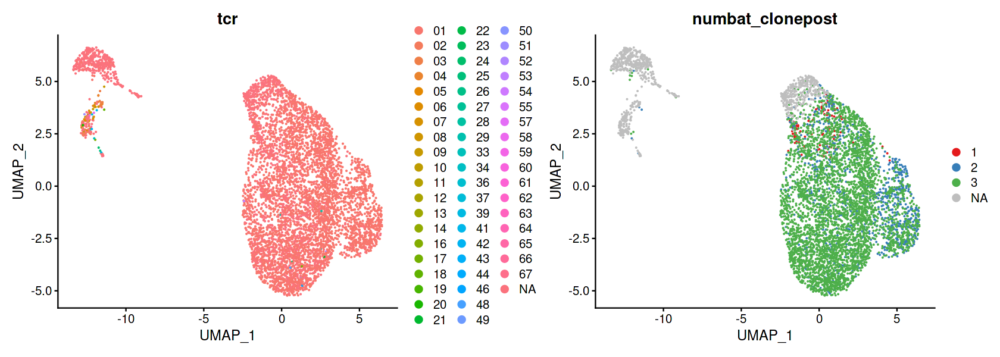

numbat_clonepost,tcr,Freq,percent
<fct>,<fct>,<int>,<dbl>
1,NA,61,0.5398230088
1,01,52,0.4601769912
2,01,711,0.7917594655
2,NA,174,0.1937639198
2,17,1,0.0011135857
2,18,1,0.0011135857
2,21,1,0.0011135857
2,25,1,0.0011135857
2,28,1,0.0011135857


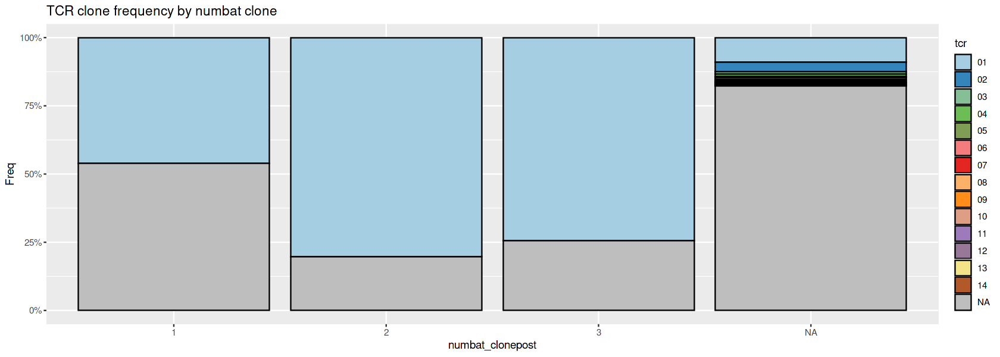

In [58]:
options(repr.plot.width=14, repr.plot.height=5)

# Generate TCR + numbat clonepost combined dimplot
plot1 <- DimPlot(CTCL, reduction = "umap", group.by = "tcr", label = FALSE, pt.size = 0.1)
plot2 <- DimPlot(CTCL, reduction = "umap", group.by = "numbat_clonepost", cols = c("#E41A1C","#377EB8","#4DAF4A", "gray"), order = c("NA", "3", "2", "1"), pt.size = 0.05, raster = FALSE)
plot1 + plot2

# Calculate frequency of tcr clone relative to numbat clone
TCR_freq <- CTCL@meta.data[, c("numbat_clonepost","tcr")] %>% table() %>% as.data.frame() %>% subset(Freq > 1) # Exclude clones with only 1 cell
palette <- colorRampPalette(colors = brewer.pal(12, "Paired"))(TCR_freq$tcr %>% unique() %>% length() - 1)
palette <- c(palette, "gray")
ggplot(TCR_freq, aes(x = numbat_clonepost, y = Freq, fill = tcr)) +
  geom_col(colour = "black", position = "fill") +
  scale_y_continuous(labels = scales::percent) +
  scale_fill_manual(values = palette) +
  ggtitle("TCR clone frequency by numbat clone")

# View relative frequency as a table
TCR_freq <- CTCL@meta.data[, c("numbat_clonepost","tcr")] %>% table() %>% as.data.frame()
TCR_freq %>%
  group_by(numbat_clonepost) %>%
  subset(Freq > 0) %>% 
  mutate(percent = Freq/sum(Freq)) %>% 
  arrange(numbat_clonepost, -percent)

Looking at the bar chart we see that numbat clone 1 (which is defined as normal), actually contains a high percentage of tcr clone 1. However, given that the number of cells in numbat clone 1 is rather small, this may simply be an artifact and we also should keep in mind that the majority of cells are still not tcr labelled.

Otherwise, we see that numbat clone 2 and 3 are both comprised of ~80% TCR clone 1, again providing evidence that these are, indeed, tumor cells. Interestingly, the TCR data does not suggest the existence of two clones as numbat is implying.


# Monocle pseudotime analysis

Given that numbat is suggesting the existence of two tumor clones and has inferred an evolutionary relationship between the two clones, we can also use pseudotime analysis to address this. Here, we use monocle (https://cole-trapnell-lab.github.io/monocle3/docs/introduction/). 

  |======================================================================| 100%
  |======================================================================| 100%
  |======================================================================| 100%


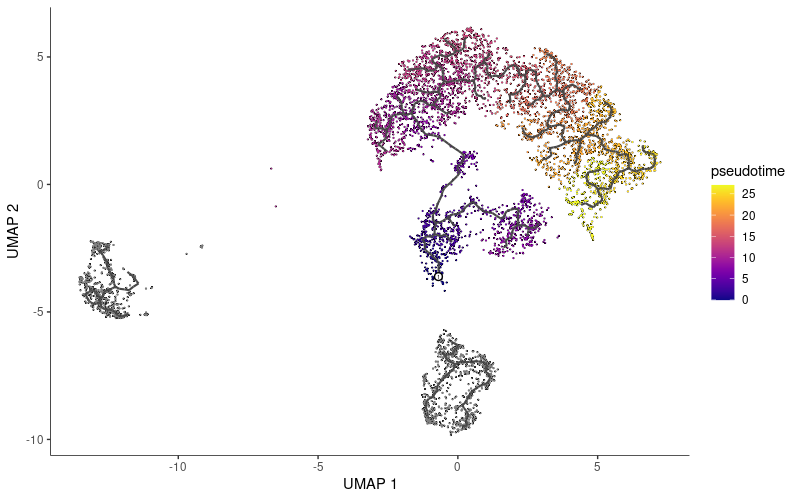

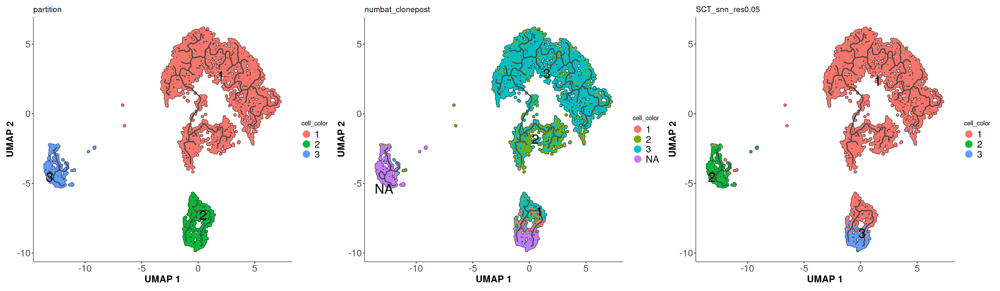

In [5]:
options(repr.plot.width=24, repr.plot.height=7)

# Install monocle3 through the cole-trapnell-lab GitHub
# library("devtools")
# devtools::install_github('cole-trapnell-lab/leidenbase')
# devtools::install_github('cole-trapnell-lab/monocle3')
# library(monocle3)

expression_matrix <- CTCL[["RNA"]]@counts
cell_metadata <- CTCL@meta.data[,c("tcr", "numbat_clonepost", "SCT_snn_res.0.05")]
gene_metadata <- data.frame(row.names = rownames(expression_matrix), gene_short_name = rownames(expression_matrix)) # This is required for new_cell_data_set() function

CTCL_monocle <- new_cell_data_set(expression_matrix,
                                  cell_metadata = cell_metadata,
                                  gene_metadata = gene_metadata)

# # Pre-process the data. Note that a batch effect correction step is not included here
CTCL_monocle <- preprocess_cds(CTCL_monocle, num_dim = 20)
CTCL_monocle <- reduce_dimension(CTCL_monocle, reduction_method = "UMAP", preprocess_method = "PCA")
CTCL_monocle <- cluster_cells(CTCL_monocle, cluster_method = 'louvain')

CTCL_monocle <- learn_graph(CTCL_monocle)

partition <- plot_cells(CTCL_monocle,
           color_cells_by = "partition",
                     label_groups_by_cluster=FALSE,
                     label_leaves=FALSE,
                     cell_size = 1,
                     group_label_size = 8,
                     label_branch_points=FALSE) +
    theme(axis.text=element_text(size=16),
          axis.title=element_text(size=16,face="bold"),
          legend.position = "right",
          legend.text=element_text(size=16)) +
    ggtitle("partition") + 
    guides(colour = guide_legend(override.aes = list(size=5)))

numbat <- plot_cells(CTCL_monocle,
           color_cells_by = "numbat_clonepost",
                     label_groups_by_cluster=FALSE,
                     label_leaves=FALSE,
                     cell_size = 1,
                     group_label_size = 8,
                     label_branch_points=FALSE) +
    theme(axis.text=element_text(size=16),
          axis.title=element_text(size=16,face="bold"),
          legend.position = "right",
          legend.text=element_text(size=16)) +
    ggtitle("numbat_clonepost") + 
    guides(colour = guide_legend(override.aes = list(size=5)))

leiden <- plot_cells(CTCL_monocle,
           color_cells_by = "SCT_snn_res.0.05",
                     label_groups_by_cluster=FALSE,
                     label_leaves=FALSE,
                     cell_size = 1,
                     group_label_size = 8,
                     label_branch_points=FALSE) +
    theme(axis.text=element_text(size=16),
          axis.title=element_text(size=16,face="bold"),
          legend.position = "right",
          legend.text=element_text(size=16)) +
    ggtitle("SCT_snn_res0.05") + 
    guides(colour = guide_legend(override.aes = list(size=5)))

partition + numbat + leiden

# This opens up interactive mode when running in RStudio, allowing you to select a starting point. It cannot be run in Jupyter Notebook so the final image is inserted instead.
# CTCL_monocle <- order_cells(CTCL_monocle)

# plot_cells(CTCL_monocle,
#            color_cells_by = "pseudotime",
#                      label_groups_by_cluster=FALSE,
#                      label_leaves=FALSE,
#                      cell_size = 1,
#                      group_label_size = 8,
#                      label_branch_points=FALSE) +
#     theme(axis.text=element_text(size=16),
#           axis.title=element_text(size=16,face="bold"),
#           legend.position = "right",
#           legend.text=element_text(size=16)) +
#     guides(colour = guide_legend(override.aes = list(size=5)))

display_png(file="/home/bobby/RStudio/CTCL_ImmuneProfiling/monocle/monocle_psuedotime_plot.png")  

save_monocle_objects(CTCL_monocle, file = "/home/bobby/RStudio/CTCL_ImmuneProfiling/monocle/cds/")

# Export pseudotime calls to the Seurat object
pseudotime <- as.data.frame(pseudotime(CTCL_monocle, reduction_method = "UMAP"))
# Replace INF pseudotime with 0
pseudotime[,1] <- gsub(pattern = "Inf", replacement = 0, x = pseudotime$`pseudotime(CTCL_monocle, reduction_method = "UMAP")`)
pseudotime[,1] <- as.numeric(pseudotime$`pseudotime(CTCL_monocle, reduction_method = "UMAP")`)
CTCL <- AddMetaData(object = CTCL, metadata = pseudotime, col.name = "pseudotime_monocle")

Note that monocle learns which cells are on a similar trajectory and will place them in close proximity when performing UMAP, clustering, or partitioning. While the UMAP will look different than that produced by Seurat, the goals of the dimensionality reduction in each is different.

Nonetheless, we can see that monocle clustering is mostly similar to what we get by standard leiden clustering. Interestingly, monocle identifies clusters cells from leiden cluster 1 and 3 together, suggesting that there may be some cluster 1 cells that should be assigned to cluster 3. 

Most importantly, we see that monocle identifies a clear pseudotime trajectory that connects numbat clone 2 and 3. And that numbat clones 2 and 3 cluster separately from numbat clone 1 and NA cells (leiden cluster 2). This provides strong evidence that we chose the correct reference for numbat analysis, but that in addition, the inferred clonal evolutionary pattern (clone 2 --> 3) may indeed be real. Psuedotime analysis further illustrates this point.

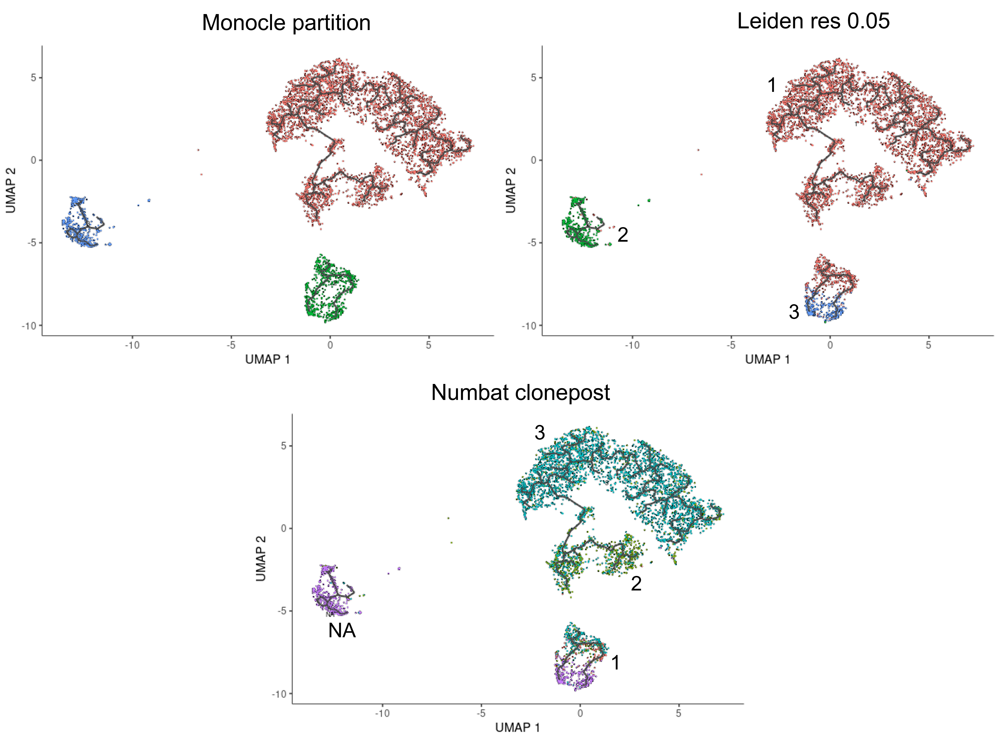

In [8]:
display_png(file="/home/bobby/RStudio/CTCL_ImmuneProfiling/monocle/monocle_combinedplots.png")  